In [1]:
weekly_load_factors = [.862,.9,.878,.834,.88,.841,.832,.806,.74,.737,.715,.727,
 .704,.75,.721,.8,.754,.837,.87,.88,.856,.811,.9,.887,.896,.861, .755,
 .816,.801,.88,.722,.776,.8,.729,.726,.705,.78,.695,.724,.724,.743,.744,
 .8,.881,.885,.909,.94,.89,.942,.97,1,.952]

In [2]:
daily_load_factors = [.93,1,.98,.96,.94,.77,.75]

In [3]:
hourly_load_factors_weekday_1_8__44_52 = [.67,.63,.60,.59,.59,.60,.74,.86,.85,.96,.96,.95,.95,.95,.93,
 .94,.99,1,1,.96,.91,.83,.73,.63]

hourly_load_factors_weekend_1_8__44_52 = [.78,.72,.68,.66,.64,.65,.66,.70,.80,.88,.90,.91,.90,.88,.87,
 .87,.91,1,.99,.97,.94,.92,.87,.81]

hourly_load_factors_weekday_9_17__31_43 = [.63,.62,.60,.58,.59,.65,.72,.85,.95,.99,1,.99,.99,.92,
 .90,.88,.90,.92,.96,.98,.96,.90,.80,.70]

hourly_load_factors_weekend_9_17__31_43 = [.65,.73,.69,.66,.65,.65,.68,.74,.83,.89,.92,.94,
 .94,.90,.90,.86,.85,.88,.92,1,.97,.95,.90,.85]

hourly_load_factors_weekday_18_30 = [.64,.60,.58,.56,.56,.58,.64,.76,.87,.95,.99,1,.99,
1,1,.97,.96,.96,.93,.92,.92,.93,.87,.72]

hourly_load_factors_weekend_18_30 = [.74,.70,.66,.65,.64,.62,.62,.66,.81,.86,.91,.93,.93,.92,
 .91,.91,.92,.94,.95,.95,1,.93,.88,.80]

In [4]:
#active power, reactive_power, apparent_power, power_factor
#MW            MVr             MWA
annual_peak_demand_load_feeder = {1:(0.3039749,0.1472218,0.33775,0.9),
2:(0.4676537,0.2264951,0.519615,0.9), 3:(0.3507403,0.1698713,0.389711,0.9),
4:(0.2338269,0.1132475,0.259808,0.9), 5:(0.2572095,0.1245723,0.285788,0.9),
6:(0.374123,0.1811961,0.415692,0.9),7:(0.2104442,0.1019228,0.233827,0.9),
8:(0.374123,0.1811961,0.415692,0.9), 9:(0.5611844,0.2717942,0.623538,0.9),
10:(0.00467653,0.00226495,0.005196,0.9), 11:(0.5611844,0.2717942,0.623538,0.9),
12:(0.4208883,0.2038456,0.467654,0.9), 13:(0.1870614,0.09059805,0.207846,0.9),
14:(0.02338269,0.01132475,0.025981,0.9), 15:(0.4208883,0.2038456,0.467654,0.9),
16:(0.444271,0.2151703,0.493635,0.9), 17:(0.5611844,0.2717942,0.623538,0.9),
18:(0.2338269,0.1132475,0.259808,0.9), 19:(7.061573,3.420076,7.846192,0.9)}

In [5]:
def hourly_demmand(feeder, weekly_lf, daily_lf, winter_weekday_hourly_lf,
                    winter_weekend_hourly_lf, summer_weekday_hourly_lf ,
                    summer_weekend_hourly_lf, spring_weekday_hourly_lf,
                    spring_weekend_hourly_lf, output):
    feed_count = 0
    week_count = 0
    day_count = 0
    hour_count = 0
    for feed in feeder:
        feed_count = feed_count+1
        week_count = 0
        output[feed_count] = {}
        # print(f'Feeder: {feed_count}, {feed}')
        for week in weekly_lf:
            week_count = week_count+1
            day_count = 0
            output[feed_count][week_count] = {}
            # print(f'Week: {week_count}, {week}')
            for day in daily_lf:
                day_count = day_count+1
                output[feed_count][week_count][day_count] = {}
                # print(f'Day: {day_count}, {day}')
                hour_count = 0
                if (week_count >= 1 and week_count <= 8) or (week_count >= 44 and week_count <= 52):
                    if day == .77 or day == .75:
                        for hour in winter_weekend_hourly_lf:
                            hour_count = hour_count+1
                            output[feed_count][week_count][day_count][hour_count] = {}
                            # print(f'Hour: {hour_count}, {hour}')
                            # print(f'AP: {feeder[feed][0]}')
                            # print(f'RP: {feeder[feed][1]}')
                            # print(f'APP: {feeder[feed][2]}')
                            power_type_1 = week * day * hour * feeder[feed][0]
                            power_type_2 = week * day * hour * feeder[feed][1]
                            power_type_3 = week * day * hour * feeder[feed][2]
                            output[feed_count][week_count][day_count][hour_count] = (power_type_1, power_type_2, power_type_3)
                            # print(f'output: {output}')
                            #input()
                    else:
                        for hour in winter_weekday_hourly_lf:
                            hour_count = hour_count+1
                            # print(f'Hour: {hour_count}, {hour}')
                            # print(f'AP: {feeder[feed][0]}')
                            # print(f'RP: {feeder[feed][1]}')
                            # print(f'APP: {feeder[feed][2]}')
                            power_type_1 = week * day * hour * feeder[feed][0]
                            power_type_2 = week * day * hour * feeder[feed][1]
                            power_type_3 = week * day * hour * feeder[feed][2]
                            output[feed_count][week_count][day_count][hour_count] = (power_type_1, power_type_2, power_type_3)
                            # print(f'output: {output}')
                            #input()

                elif (week_count >= 9 and week_count <= 17) or (week_count >= 31 and week_count <= 43):
                    if day == .77 or day == .75:
                        for hour in spring_weekend_hourly_lf:
                            hour_count = hour_count+1
                            # print(f'Hour: {hour_count}, {hour}')
                            # print(f'AP: {feeder[feed][0]}')
                            # print(f'RP: {feeder[feed][1]}')
                            # print(f'APP: {feeder[feed][2]}')
                            power_type_1 = week * day * hour * feeder[feed][0]
                            power_type_2 = week * day * hour * feeder[feed][1]
                            power_type_3 = week * day * hour * feeder[feed][2]
                            output[feed_count][week_count][day_count][hour_count] = (power_type_1, power_type_2, power_type_3)
                            # print(f'output: {output}')
                            #input()
                    else:
                        for hour in spring_weekday_hourly_lf:
                            hour_count = hour_count+1
                            # print(f'Hour: {hour_count}, {hour}')
                            # print(f'AP: {feeder[feed][0]}')
                            # print(f'RP: {feeder[feed][1]}')
                            # print(f'APP: {feeder[feed][2]}')
                            power_type_1 = week * day * hour * feeder[feed][0]
                            power_type_2 = week * day * hour * feeder[feed][1]
                            power_type_3 = week * day * hour * feeder[feed][2]
                            output[feed_count][week_count][day_count][hour_count] = (power_type_1, power_type_2, power_type_3)
                            # print(f'output: {output}')
                            #input()
                elif (week_count >= 18 and week_count <= 30):
                    if day == .77 or day == .75:
                        for hour in summer_weekend_hourly_lf:
                            hour_count = hour_count+1
                            # print(f'Hour: {hour_count}, {hour}')
                            # print(f'AP: {feeder[feed][0]}')
                            # print(f'RP: {feeder[feed][1]}')
                            # print(f'APP: {feeder[feed][2]}')
                            power_type_1 = week * day * hour * feeder[feed][0]
                            power_type_2 = week * day * hour * feeder[feed][1]
                            power_type_3 = week * day * hour * feeder[feed][2]
                            output[feed_count][week_count][day_count][hour_count] = (power_type_1, power_type_2, power_type_3)
                            # print(f'output: {output}')
                            #input()
                    else:
                        for hour in summer_weekday_hourly_lf:
                            hour_count = hour_count+1
                            # print(f'Hour: {hour_count}, {hour}')
                            # print(f'AP: {feeder[feed][0]}')
                            # print(f'RP: {feeder[feed][1]}')
                            # print(f'APP: {feeder[feed][2]}')
                            power_type_1 = week * day * hour * feeder[feed][0]
                            power_type_2 = week * day * hour * feeder[feed][1]
                            power_type_3 = week * day * hour * feeder[feed][2]
                            output[feed_count][week_count][day_count][hour_count] = (power_type_1, power_type_2, power_type_3)
                            # print(f'output: {output}')
                            #input()
    return output

In [6]:
output = {}
output = hourly_demmand(annual_peak_demand_load_feeder, weekly_load_factors, daily_load_factors,
                hourly_load_factors_weekday_1_8__44_52,
                hourly_load_factors_weekend_1_8__44_52,
                hourly_load_factors_weekday_18_30,
                hourly_load_factors_weekend_18_30,
                hourly_load_factors_weekday_9_17__31_43,
                hourly_load_factors_weekend_9_17__31_43,
                output
                )

In [7]:
print(output)

{1: {1: {1: {1: (0.16326862728378, 0.07907462488596001, 0.18140964555), 2: (0.15352124655042, 0.07435375175844, 0.17057921895), 3: (0.14621071100039998, 0.07081309691280001, 0.162456399), 4: (0.14377386581706, 0.06963287863092, 0.15974879235), 5: (0.14377386581706, 0.06963287863092, 0.15974879235), 6: (0.14621071100039998, 0.07081309691280001, 0.162456399), 7: (0.18032654356716, 0.08733615285912001, 0.2003628921), 8: (0.20956868576724, 0.10149877224168001, 0.23285417190000002), 9: (0.2071318405839, 0.10031855395980001, 0.23014656525), 10: (0.23393713760064, 0.11330095506048, 0.2599302384), 11: (0.23393713760064, 0.11330095506048, 0.2599302384), 12: (0.23150029241729997, 0.1121207367786, 0.25722263175), 13: (0.23150029241729997, 0.1121207367786, 0.25722263175), 14: (0.23150029241729997, 0.1121207367786, 0.25722263175), 15: (0.22662660205062002, 0.10976030021484003, 0.25180741845000004), 16: (0.22906344723396, 0.11094051849672001, 0.2545150251), 17: (0.24124767315065998, 0.11684160990612

In [8]:
import sys

sys.getsizeof(output)

648

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

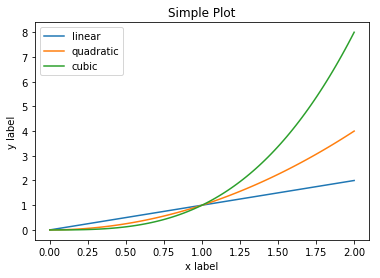

In [10]:
x = np.linspace(0, 2, 100)

plt.plot(x, x, label='linear')
plt.plot(x, x**2, label='quadratic')
plt.plot(x, x**3, label='cubic')

plt.xlabel('x label')
plt.ylabel('y label')

plt.title("Simple Plot")

plt.legend()

plt.show()

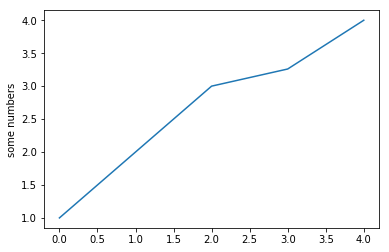

In [11]:
plt.plot([1, 2, 3, 3.26, 4])
plt.ylabel('some numbers')
plt.show()

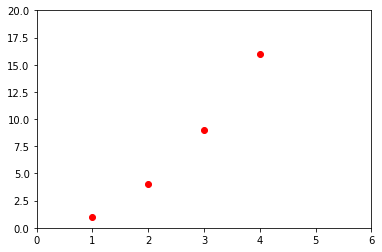

In [12]:
plt.plot([1, 2, 3, 4], [1, 4, 9, 16], 'ro')
plt.axis([0, 6, 0, 20])
plt.show()

In [13]:
xs = []
ys = []
zs = []
for feed in range(1,len(output)+1):
    for week in range(1, len(output[feed])+1):
        for day in range(1, len(output[feed][week])+1):
            for hour in range(1, len(output[feed][week][day])+1):
                xs.append(output[feed][week][day][hour][0])
                ys.append(output[feed][week][day][hour][1])
                zs.append(output[feed][week][day][hour][2])
#print(xs)

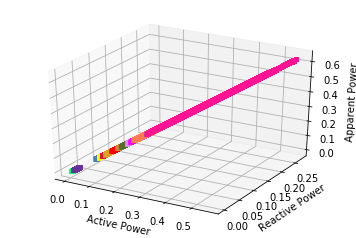

In [21]:
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# for feed in range(1,len(output)+1):
#     for week in range(1, len(output[feed])+1):
#         for day in range(1, len(output[feed][week])+1):
#             for hour in range(1, len(output[feed][week][day])+1):
#                 xs.append(output[feed][week][day][hour][0])
#                 ys.append(output[feed][week][day][hour][1])
#                 zs.append(output[feed][week][day][hour][2])

for c, feed in [('r', 1), ('coral', 2), ('peru', 3), ('wheat', 4), ('goldenrod', 5), 
                ('darkkhaki', 6), ('yellow', 7), ('darkolivegreen', 8), ('lawngreen', 9), 
                ('springgreen', 10), ('lightseagreen', 11), ('aqua', 12), ('steelblue', 13), 
                ('rebeccapurple', 14), ('violet', 15), ('fuchsia', 16), ('deeppink', 17), 
                ('crimson', 18), ('black', 19)]:
    xs = []
    ys = []
    zs = []
    for week in range(1, len(output[feed])+1):
        for day in range(1, len(output[feed][week])+1):
            for hour in range(1, len(output[feed][week][day])+1):
                xs.append(output[feed][week][day][hour][0])
                ys.append(output[feed][week][day][hour][1])
                zs.append(output[feed][week][day][hour][2])
    ax.scatter(xs, ys, zs, c=c, marker=',')
    
ax.set_xlabel('Active Power')
ax.set_ylabel('Reactive Power')
ax.set_zlabel('Apparent Power')
plt.show()

r 1
coral 2
peru 3
wheat 4
goldenrod 5
darkkhaki 6
yellow 7
darkolivegreen 8
lawngreen 9
springgreen 10
lightseagreen 11
aqua 12
steelblue 13
rebeccapurple 14
violet 15
fuchsia 16
deeppink 17
crimson 18


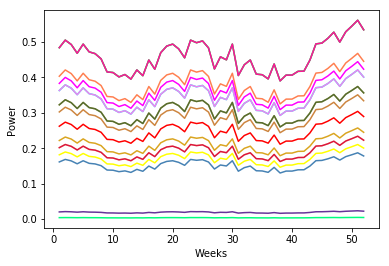

In [37]:
fig = plt.figure()
rp = fig.add_subplot(111)

for color, feed in [('r', 1), ('coral', 2), ('peru', 3), ('wheat', 4), ('goldenrod', 5), 
                ('darkkhaki', 6), ('yellow', 7), ('darkolivegreen', 8), ('lawngreen', 9), 
                ('springgreen', 10), ('lightseagreen', 11), ('aqua', 12), ('steelblue', 13), 
                ('rebeccapurple', 14), ('violet', 15), ('fuchsia', 16), ('deeppink', 17), 
                ('crimson', 18)]:
    print(color, feed)
    weekly_power_values = []
    week_timestamps = []
    hourly_values = []
    
    
    week_count = 0
    for week in range(1, len(output[feed])+1):
        
        week_count = week_count+1
        week_timestamps.append(week_count)
        
        hourly_power_values = []
        
        for day in range(1, len(output[feed][week])+1):
            for hour in range(1, len(output[feed][week][day])+1):
                hourly_power_values.append(output[feed][week][day][hour][0])
        
        weekly_power_values.append(max(hourly_power_values))
    rp.plot(week_timestamps, weekly_power_values, c=color, label=f'Feeder {feed}')

    
#ax.scatter(xs, ys, c='goldenrod', marker=',')
rp.set_xlabel('Weeks')
rp.set_ylabel('Power')
#ax.set_zlabel('Apparent Power')
plt.show()